In [2]:

# Importa as bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap, MarkerCluster
from datetime import datetime, timedelta

from pandas.plotting import autocorrelation_plot

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, LabelEncoder
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing  

from prophet import Prophet

import dash
from dash import Dash, dcc, html, Input, Output 


c:\Users\renan\OneDrive\Documentos\Estudos\ProjetosGit\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Carregar e Pré-processar os Dados

df = pd.read_csv(r'C:\Users\renan\OneDrive\Documentos\Arquivos_CSV\cat_acidentes.csv', sep=';', header=0)

# Remover linhas com valores NaN em latitude ou longitude
df = df.dropna(subset=['latitude', 'longitude'], how='any')

# Converter colunas para float
df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)

df['data'] = pd.to_datetime(df['data'], errors='coerce')

# Criar coluna 'ano' a partir da coluna 'data'
df['ano'] = df['data']
# Converter a coluna 'data' para datetimedt.year

# Filtrar anos indesejados
df = df[~df['ano'].isin([2202, 2026, 2027])]


# Criar coluna 'dia_sem' com o dia da semana (0 = segunda-feira, 6 = domingo)
df['dia_sem'] = df['data'].dt.dayofweek

# Converter a coluna 'hora' para o formato correto (HH:MM:SS)
df['hora'] = pd.to_datetime(df['hora'], errors='coerce').dt.strftime('%H:%M:%S')

# Remover valores nulos na coluna 'hora'
df = df.dropna(subset=['hora'])

# Converter a coluna 'hora' para formato numérico (hora do dia em decimal)
df['hora_decimal'] = pd.to_datetime(df['hora'], format='%H:%M:%S').dt.hour + \
                     pd.to_datetime(df['hora'], format='%H:%M:%S').dt.minute / 60

# Codificar a coluna 'regiao' em valores numéricos
le = LabelEncoder()
df['regiao_encoded'] = le.fit_transform(df['regiao'])

# Contar o número de acidentes por 'dia_sem' e 'hora'
df_acidentes = df.groupby(['dia_sem', 'hora']).size().reset_index(name='num_acidentes')

In [5]:
# Criar mapa de calor
mapa_calor = folium.Map(location=[-30.1, -51.15], zoom_start=11)
coordenadas = df[['latitude', 'longitude']].values.tolist()
HeatMap(coordenadas, radius=9, blur=10).add_to(mapa_calor)
mapa_calor.save("mapa_calor.html")
mapa_calor

In [6]:
# Criar mapa com clusters

mapa_cluster = folium.Map(location=[-30.1, -51.15], zoom_start=11)
MarkerCluster(locations=coordenadas).add_to(mapa_cluster)
mapa_cluster.save("mapa_cluster.html")
mapa_cluster

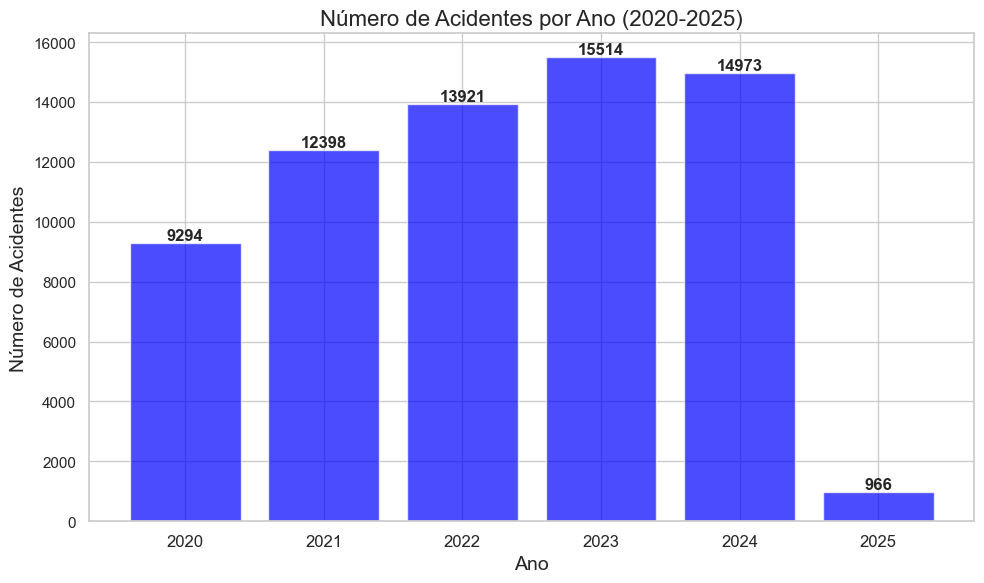

In [ ]:
#Dados até 01 de Fevereiro de 2025

# Número de acidentes por ano (2020-2025)

# Garantir que todos os anos de 2020 a 2025 estejam presentes no DataFrame
anos_completos = pd.DataFrame({'ano': [2020, 2021, 2022, 2023, 2024, 2025]})
acidentes_por_ano = anos_completos.merge(acidentes_por_ano, on='ano', how='left').fillna(0)

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
bars = plt.bar(acidentes_por_ano['ano'], acidentes_por_ano['num_acidentes'], color='blue', alpha=0.7)

# Adicionar valores sobre cada barra
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.05, 
             str(int(height)), 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

# Configurar o eixo X para mostrar apenas os anos de interesse
plt.xticks(acidentes_por_ano['ano'], labels=[str(int(year)) for year in acidentes_por_ano['ano']], fontsize=12)

# Adicionar título e rótulos
plt.title('Número de Acidentes por Ano (2020-2025)', fontsize=16)
plt.xlabel('Ano', fontsize=14)
plt.ylabel('Número de Acidentes', fontsize=14)

# Ajustar layout para evitar cortes
plt.tight_layout()

# Exibir o gráfico
plt.show()

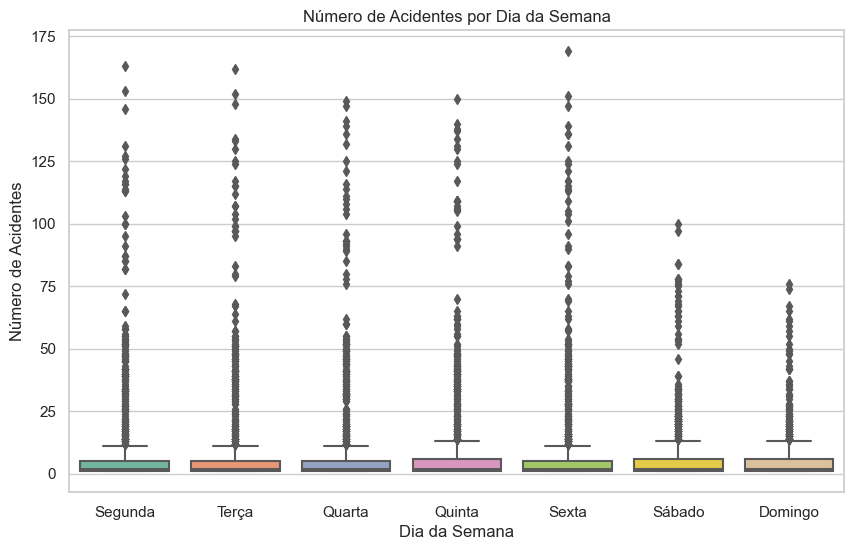

In [ ]:
#Boxplot
# Gráfico de acidentes por dia da semana
# Aplicar um tema do Seaborn
sns.set_theme(style="whitegrid")

# Criar o gráfico
plt.figure(figsize=(10, 6))
sns.boxplot(x='dia_sem', y='num_acidentes', data=df_acidentes, palette="Set2")

# Rótulos do eixo X
dias_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks(ticks=range(7), labels=dias_semana)

# Adicionar título e rótulos dos eixos
plt.title('Número de Acidentes por Dia da Semana')
plt.xlabel('Dia da Semana')
plt.ylabel('Número de Acidentes')

# Exibir o gráfico
plt.show()

Matriz de Correlação:
                 dia_sem  hora_decimal  regiao_encoded  num_acidentes
dia_sem         1.000000      0.008363        0.018572      -0.176717
hora_decimal    0.008363      1.000000        0.025768       0.071834
regiao_encoded  0.018572      0.025768        1.000000       0.023336
num_acidentes  -0.176717      0.071834        0.023336       1.000000


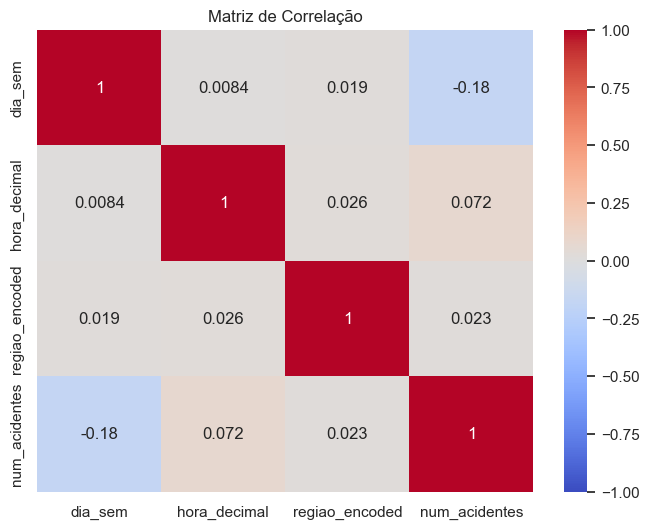

In [9]:
# Matriz de correlçaão entre as variáveis hora, dia da semana e região

# Converter a coluna 'hora' para o formato correto (HH:MM:SS)
df['hora'] = pd.to_datetime(df['hora'], errors='coerce').dt.strftime('%H:%M:%S')

# Remover valores nulos na coluna 'hora'
df = df.dropna(subset=['hora'])

# Converter a coluna 'hora' para formato numérico (hora do dia em decimal)
df['hora_decimal'] = pd.to_datetime(df['hora'], format='%H:%M:%S').dt.hour + \
                     pd.to_datetime(df['hora'], format='%H:%M:%S').dt.minute / 60

# Criar a coluna 'num_acidentes' no DataFrame original
df['num_acidentes'] = df.groupby(['dia_sem', 'hora'])['hora'].transform('count')

# Criar 'regiao_encoded' (exemplo - adapte ao seu caso)
if 'regiao' in df.columns:  # Verifica se a coluna 'regiao' existe
    df['regiao_encoded'] = df['regiao'].astype('category').cat.codes  # Codificação de região
else:
    print("A coluna 'regiao' não foi encontrada no DataFrame.")

# Calcular a matriz de correlação
correlacao = df[['dia_sem', 'hora_decimal', 'regiao_encoded', 'num_acidentes']].corr()

# Exibir a matriz de correlação
print("Matriz de Correlação:")
print(correlacao)

# Heatmap da matriz de correlação
plt.figure(figsize=(8, 6))
sns.heatmap(correlacao, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlação')
plt.show()

In [34]:
# Converter a coluna 'hora' para o formato datetime
df['hora'] = pd.to_datetime(df['hora'], format='%H:%M:%S', errors='coerce')

# Remover valores nulos na coluna 'hora'
df = df.dropna(subset=['hora'])

# Converter a hora para formato numérico (hora do dia em decimal)
df['hora_decimal'] = df['hora'].dt.hour + df['hora'].dt.minute / 60 + df['hora'].dt.second / 3600

# Exibir o DataFrame 
print(df)

Empty DataFrame
Columns: [data_extracao, predial1, queda_arr, feridos, feridos_gr, mortes, morte_post, fatais, auto, taxi, lotacao, onibus_urb, onibus_met, onibus_int, caminhao, moto, carroca, bicicleta, outro, cont_vit, ups, patinete, idacidente, longitude, latitude, log1, log2, tipo_acid, dia_sem, hora, noite_dia, regiao, consorcio, ano, num_acidentes, hora_decimal]
Index: []

[0 rows x 36 columns]


In [ ]:
# Verificar as colunas existentes
print("Colunas existentes no DataFrame:")
print(df.columns)

Colunas existentes no DataFrame:
Index(['data_extracao', 'predial1', 'queda_arr', 'data', 'feridos',
       'feridos_gr', 'mortes', 'morte_post', 'fatais', 'auto', 'taxi',
       'lotacao', 'onibus_urb', 'onibus_met', 'onibus_int', 'caminhao', 'moto',
       'carroca', 'bicicleta', 'outro', 'cont_vit', 'ups', 'patinete',
       'idacidente', 'longitude', 'latitude', 'log1', 'log2', 'tipo_acid',
       'dia_sem', 'hora', 'noite_dia', 'regiao', 'consorcio', 'ano'],
      dtype='object')


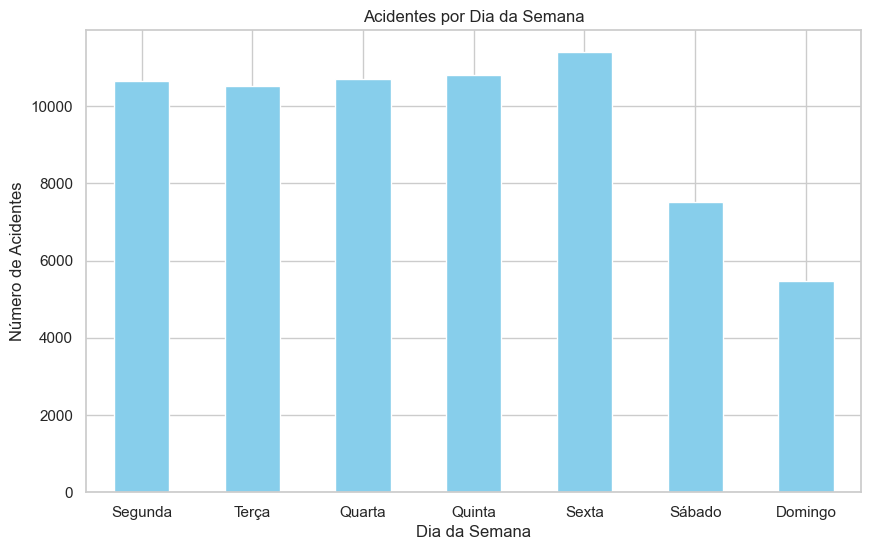

In [ ]:
# Total de acidentes por dia da semana

# Criar a coluna 'dia_sem' com o dia da semana (0 = segunda-feira, 6 = domingo)
df['dia_sem'] = df.index.dayofweek

# Agrupar por dia da semana e contar o número de acidentes
acidentes_por_dia = df.groupby('dia_sem').size()

# Plotar o gráfico de barras
plt.figure(figsize=(10, 6))
acidentes_por_dia.plot(kind='bar', title='Acidentes por Dia da Semana', color='skyblue')

# Personalizar os rótulos do eixo X
dias_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks(range(7), dias_semana, rotation=0)  # Define os rótulos do eixo X

# Adicionar rótulos aos eixos
plt.xlabel('Dia da Semana')
plt.ylabel('Número de Acidentes')

# Exibir o gráfico
plt.show()


<AxesSubplot: title={'center': 'Acidentes por Mês'}, xlabel='data'>

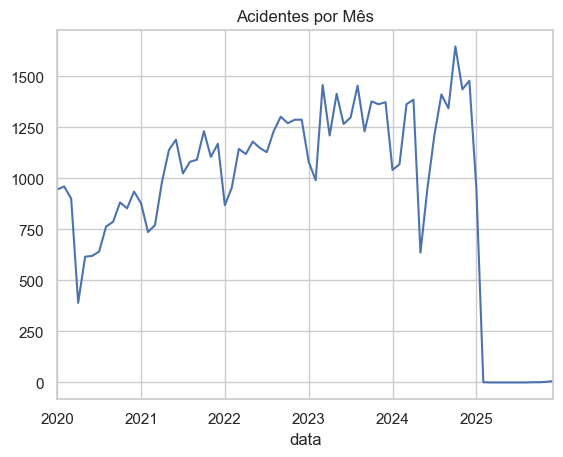

In [ ]:
# Acidentes por Mês (2020-2025)

# Adicionar uma coluna para contar acidentes
df['num_acidentes'] = 1

# Agrupar por mês e somar os acidentes
acidentes_por_mes = df.resample('M')['num_acidentes'].sum()

# Plotar o resultado
acidentes_por_mes.plot(title='Acidentes por Mês')


C:\Users\renan\AppData\Local\Temp\ipykernel_9952\2043213308.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



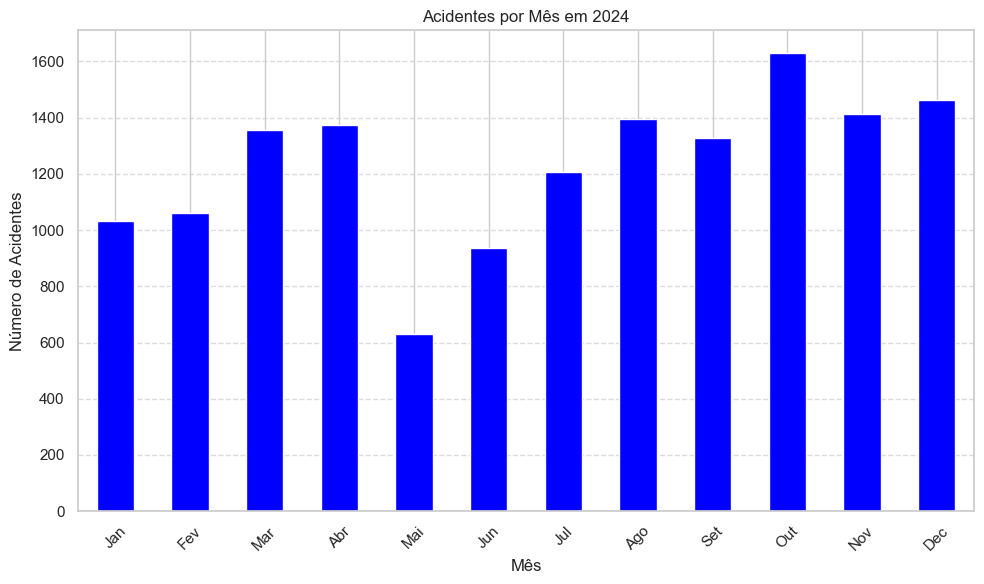

In [ ]:
# Análise dos acidentes por mês em 2024

# Filtrar apenas o ano de 2024
df_2024 = df[df['ano'] == 2024]

# Verificar se há dados para 2024
if df_2024.empty:
    print("\nNão há dados disponíveis para o ano de 2024.")
else:
    # Adicionar uma coluna para contar acidentes
    df_2024['num_acidentes'] = 1

    # Agrupar por mês e somar os acidentes
    acidentes_por_mes_2024 = df_2024.resample('M', on='data')['num_acidentes'].sum()

    # Plotar o resultado
    plt.figure(figsize=(10, 6))
    acidentes_por_mes_2024.plot(kind='bar', title='Acidentes por Mês em 2024', color='blue')
    plt.xlabel('Mês')
    plt.ylabel('Número de Acidentes')
    plt.xticks(range(12), ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dec'], rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

c:\Users\renan\OneDrive\Documentos\Estudos\ProjetosGit\venv\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



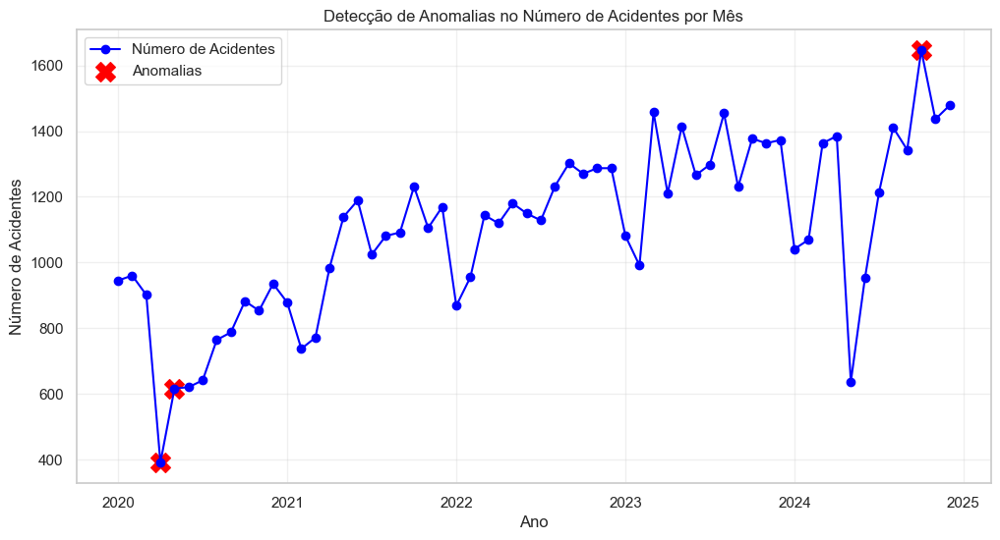

In [ ]:
# Detecção de Anomalias no Número de acidentes por mês com Isolation Forest

# Carregar e Pré-processar os Dados
df = pd.read_csv(r'C:\Users\renan\OneDrive\Documentos\Arquivos_CSV\cat_acidentes.csv', sep=';', header=0)

# Converter a coluna 'data' para datetime
df['data'] = pd.to_datetime(df['data'], errors='coerce')

# Criar coluna 'ano' a partir da coluna 'data'
df['ano'] = df['data'].dt.year  # Extrair o ano da coluna 'data'

# Filtrar anos indesejados
df = df[~df['ano'].isin([2202, 2026, 2027, 2025])]

# Criar a série temporal do número de acidentes por mês
df_mensal = df.set_index('data').resample('M').size().reset_index()  # Corrigido: Usar resample no índice
df_mensal.columns = ['data', 'num_acidentes']

# Criar variável de tempo para análise
df_mensal['mes_frac'] = df_mensal['data'].dt.year + (df_mensal['data'].dt.month - 1) / 12

# Aplicar Isolation Forest para detectar anomalias
modelo_if = IsolationForest(contamination=0.05, random_state=42)  # 5% de contaminação (anomalias esperadas)
df_mensal['anomalia'] = modelo_if.fit_predict(df_mensal[['num_acidentes']])

# Destacar anomalias
anomalias = df_mensal[df_mensal['anomalia'] == -1]

# Plotar os resultados
plt.figure(figsize=(12, 6))
plt.plot(df_mensal['mes_frac'], df_mensal['num_acidentes'], label='Número de Acidentes', color='blue', marker='o')
plt.scatter(anomalias['mes_frac'], anomalias['num_acidentes'], color='red', label='Anomalias', marker='X', s=200)
plt.title('Detecção de Anomalias no Número de Acidentes por Mês')
plt.xlabel('Ano')
plt.ylabel('Número de Acidentes')
plt.legend()
plt.grid(alpha=0.3)  # Adicionado alpha para melhorar a visualização da grade
plt.show()

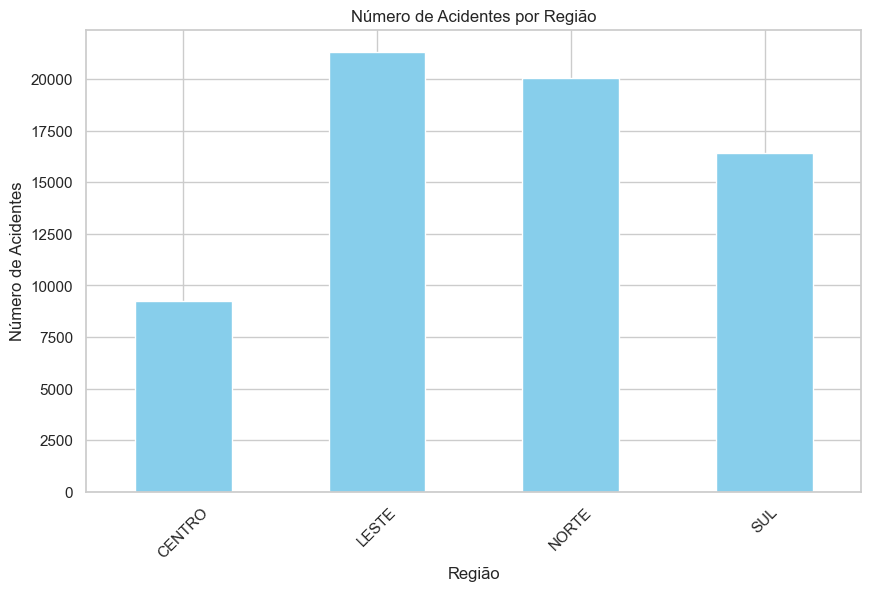

In [ ]:
# Número de acidentes por Região

# Converter colunas 'latitude' e 'longitude' para float
df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)


# Adicionar uma coluna para contar acidentes
df['num_acidentes'] = 1

# Agrupar por 'regiao' e plotar
plt.figure(figsize=(10, 6))
df.groupby('regiao')['num_acidentes'].sum().plot(kind='bar', color='skyblue')
plt.title('Número de Acidentes por Região')
plt.xlabel('Região')
plt.ylabel('Número de Acidentes')
plt.xticks(rotation=45)
plt.show()

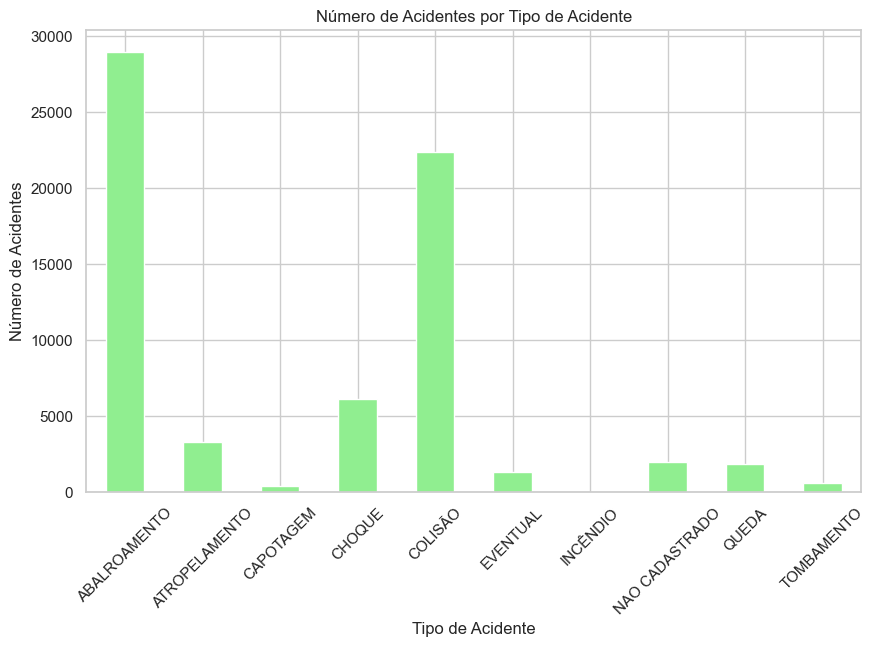

In [ ]:
# Número de acidentes por tipo de acidente

# Agrupar por 'tipo_acid' e plotar
plt.figure(figsize=(10, 6))
df.groupby('tipo_acid')['num_acidentes'].sum().plot(kind='bar', color='lightgreen')
plt.title('Número de Acidentes por Tipo de Acidente')
plt.xlabel('Tipo de Acidente')
plt.ylabel('Número de Acidentes')
plt.xticks(rotation=45)
plt.show()

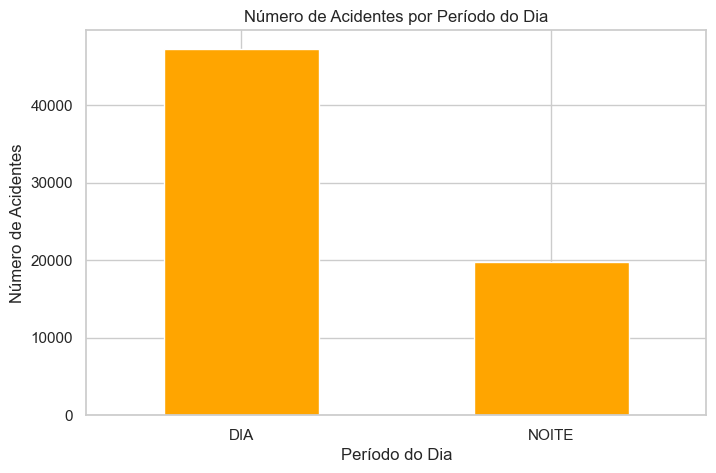

In [ ]:
# Número de acidentes por período do dia

# Agrupar por 'noite_dia' e plotar
plt.figure(figsize=(8, 5))
df.groupby('noite_dia')['num_acidentes'].sum().plot(kind='bar', color='orange')
plt.title('Número de Acidentes por Período do Dia')
plt.xlabel('Período do Dia')
plt.ylabel('Número de Acidentes')
plt.xticks(rotation=0)
plt.show()

In [84]:
print(df['regiao'].value_counts())
print(df['noite_dia'].value_counts())

LESTE     21320
NORTE     20062
SUL       16424
CENTRO     9259
Name: regiao, dtype: int64
DIA      47285
NOITE    19781
Name: noite_dia, dtype: int64


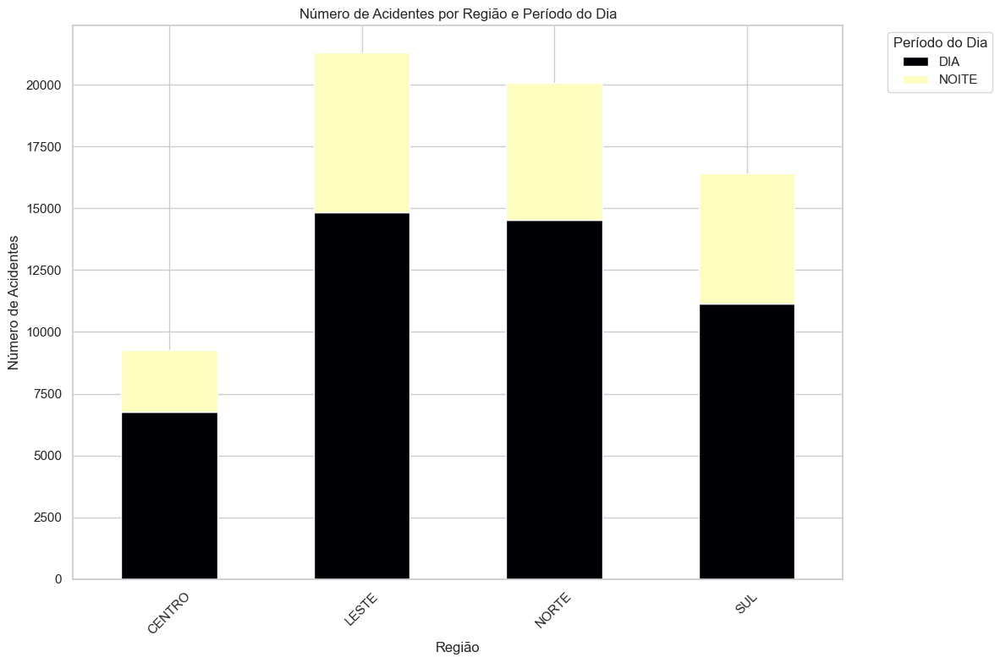

In [ ]:
# Número de acidentes por região e período do dia

# Agrupar por 'regiao' e 'noite_dia' e contar o número de acidentes
agrupado = df.groupby(['regiao', 'noite_dia']).size().unstack()

# Plotar o gráfico de barras agrupadas
agrupado.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='magma')
plt.title('Número de Acidentes por Região e Período do Dia')
plt.xlabel('Região')
plt.ylabel('Número de Acidentes')
plt.xticks(rotation=45)
plt.legend(title='Período do Dia', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
# Adiciona uma coluna para contar os acidentes

df['num_acidentes'] = 1  

# Agrupar por mês e somar os acidentes
df_mensal = df.resample('M')['num_acidentes'].sum().reset_index()

# Renomear colunas
df_mensal.columns = ['data', 'num_acidentes']

# Adicionar colunas de ano e mês
df_mensal['ano'] = df_mensal['data'].dt.year
df_mensal['mes'] = df_mensal['data'].dt.month

print(df_mensal.head())

        data  num_acidentes   ano  mes
0 2020-01-31            945  2020    1
1 2020-02-29            960  2020    2
2 2020-03-31            901  2020    3
3 2020-04-30            390  2020    4
4 2020-05-31            616  2020    5


c:\Users\renan\OneDrive\Documentos\Estudos\ProjetosGit\venv\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



Erro Absoluto Médio (MAE): 133.07
Erro Quadrático Médio (RMSE): 183.47


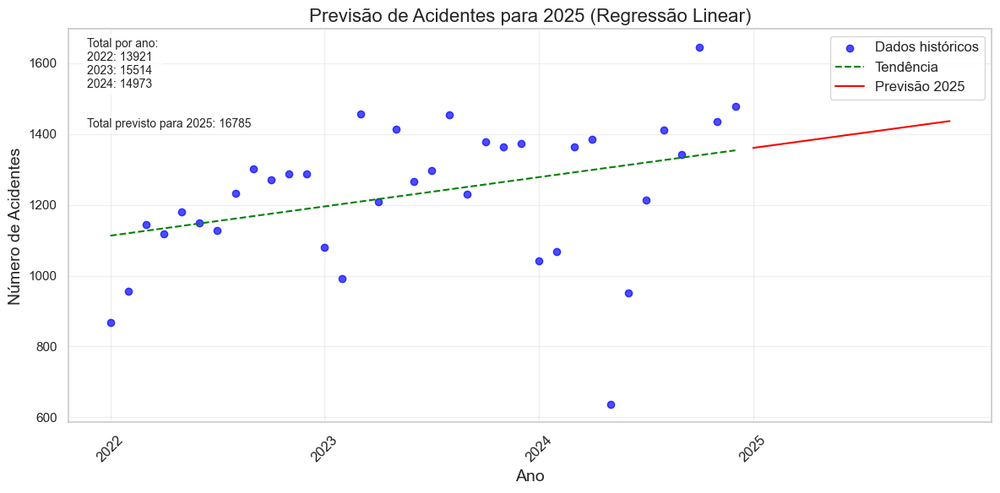


Coeficientes do modelo:
[82.61930502]
-165943.16567996997

Dados de entrada (df_mensal):
        data  num_acidentes     ano_frac   ano
0 2022-01-31            868  2022.000000  2022
1 2022-02-28            955  2022.083333  2022
2 2022-03-31           1144  2022.166667  2022
3 2022-04-30           1119  2022.250000  2022
4 2022-05-31           1180  2022.333333  2022

Variável X (ano_frac):
      ano_frac
0  2022.000000
1  2022.083333
2  2022.166667
3  2022.250000
4  2022.333333

Variável y (num_acidentes):
0     868
1     955
2    1144
3    1119
4    1180
Name: num_acidentes, dtype: int64

Dados futuros (anos_2025):
[[2025.        ]
 [2025.08333333]
 [2025.16666667]
 [2025.25      ]
 [2025.33333333]
 [2025.41666667]
 [2025.5       ]
 [2025.58333333]
 [2025.66666667]
 [2025.75      ]
 [2025.83333333]
 [2025.91666667]]

Previsões para 2025:
[1360.92698413 1367.81192621 1374.6968683  1381.58181038 1388.46675247
 1395.35169455 1402.23663664 1409.12157872 1416.00652081 1422.89146289
 142

In [ ]:
# Regressão Linear para Previsão de Acidentes de Trânsito (Entre 2022-2024)

# Filtrar dados: Remover os anos 2020, 2021, 2025, 2026, 2027 e 2202
df = df[~df['ano'].isin([2020, 2021, 2025, 2026, 2027, 2202])]

# Criar série temporal do número de acidentes por mês
df_mensal = df.resample('M', on='data').size().reset_index()
df_mensal.columns = ['data', 'num_acidentes']

# Criar variável de tempo (anos fracionados para regressão)
df_mensal['ano_frac'] = df_mensal['data'].dt.year + (df_mensal['data'].dt.month - 1) / 12

# Definir variáveis para o modelo
X = df_mensal[['ano_frac']]  # Variável independente (tempo)
y = df_mensal['num_acidentes']  # Variável dependente (número de acidentes)

# Criar e treinar o modelo de Regressão Linear
modelo = LinearRegression()
modelo.fit(X, y)

# Criar dados futuros para previsão de janeiro a dezembro de 2025
anos_2025 = np.arange(2025, 2026, 1/12).reshape(-1, 1)  # Janeiro a dezembro de 2025
previsao_2025 = modelo.predict(anos_2025)

# Avaliação do modelo
y_pred = modelo.predict(X)
mae = mean_absolute_error(y, y_pred)
rmse = np.sqrt(mean_squared_error(y, y_pred))
print(f"Erro Absoluto Médio (MAE): {mae:.2f}")
print(f"Erro Quadrático Médio (RMSE): {rmse:.2f}")

# Total previsto para 2025 (janeiro a dezembro)
total_2025 = previsao_2025.sum()

# Calcular o total de acidentes por ano
df_mensal['ano'] = df_mensal['data'].dt.year  # Adicionar coluna 'ano' ao DataFrame
total_por_ano = df_mensal.groupby('ano')['num_acidentes'].sum().reset_index()

# Criar uma string formatada com os totais por ano
totais_por_ano_str = "\n".join([f"{row['ano']}: {int(row['num_acidentes'])}" for _, row in total_por_ano.iterrows()])

# Plotando os resultados
plt.figure(figsize=(12, 6))

# Dados históricos
plt.scatter(df_mensal['ano_frac'], df_mensal['num_acidentes'], label='Dados históricos', color='blue', alpha=0.7)

# Linha de tendência (regressão linear)
plt.plot(df_mensal['ano_frac'], y_pred, color='green', linestyle='dashed', label='Tendência')

# Previsões para 2025
plt.plot(anos_2025, previsao_2025, color='red', label='Previsão 2025')

# Configurações do gráfico
plt.title('Previsão de Acidentes para 2025 (Regressão Linear)', fontsize=16)
plt.xlabel('Ano', fontsize=14)
plt.ylabel('Número de Acidentes', fontsize=14)

# Formatar eixo X para mostrar anos como números inteiros
plt.xticks(ticks=np.arange(df_mensal['ano_frac'].min(), 2026, 1),  # Definir ticks de 1 em 1 ano
           labels=[str(int(ano)) for ano in np.arange(df_mensal['ano_frac'].min(), 2026, 1)],  # Rótulos como inteiros
           rotation=45, fontsize=12)

plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Adicionar anotações para os totais por ano e previsões para 2025
plt.annotate(f"Total por ano:\n{totais_por_ano_str}", 
             xy=(0.02, 0.85), xycoords='axes fraction',  # Movido para baixo
             fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.annotate(f"Total previsto para 2025: {int(total_2025)}", 
             xy=(0.02, 0.75), xycoords='axes fraction',  # Movido para baixo
             fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# Verificar coeficientes do modelo
print("\nCoeficientes do modelo:")
print(modelo.coef_)  # Coeficiente angular
print(modelo.intercept_)  # Coeficiente linear

# Verificar dados de entrada
print("\nDados de entrada (df_mensal):")
print(df_mensal.head())

# Verificar variáveis X e y
print("\nVariável X (ano_frac):")
print(X.head())

print("\nVariável y (num_acidentes):")
print(y.head())

# Verificar dados futuros
print("\nDados futuros (anos_2025):")
print(anos_2025)

# Verificar previsões para 2025
print("\nPrevisões para 2025:")
print(previsao_2025)

c:\Users\renan\OneDrive\Documentos\Estudos\ProjetosGit\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



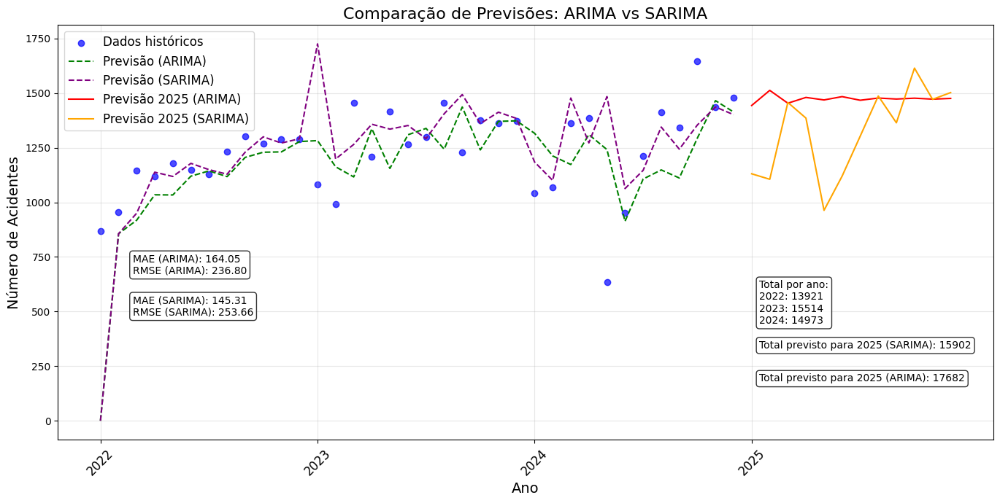

ARIMA:
Erro Absoluto Médio (MAE): 164.05
Erro Quadrático Médio (RMSE): 236.80

SARIMA:
Erro Absoluto Médio (MAE): 145.31
Erro Quadrático Médio (RMSE): 253.66


In [ ]:
# Modelo ARIMA vs SARIMA

# Função para criar série temporal mensal
def criar_serie_temporal(df):
    df_mensal = df.resample('M', on='data').size().reset_index()
    df_mensal.columns = ['data', 'num_acidentes']
    df_mensal['ano_frac'] = df_mensal['data'].dt.year + (df_mensal['data'].dt.month - 1) / 12
    return df_mensal

# Função para treinar e prever com ARIMA
def modelo_arima(y):
    modelo_arima = ARIMA(y, order=(5, 1, 0))
    resultado_arima = modelo_arima.fit()
    y_pred_arima = resultado_arima.fittedvalues
    return resultado_arima, y_pred_arima

# Função para treinar e prever com SARIMA
def modelo_sarima(y):
    modelo_sarima = SARIMAX(y, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    resultado_sarima = modelo_sarima.fit()
    y_pred_sarima = resultado_sarima.fittedvalues
    return resultado_sarima, y_pred_sarima

# Função para avaliar modelos
def avaliar_modelos(y, y_pred_arima, y_pred_sarima):
    mae_arima = mean_absolute_error(y, y_pred_arima)
    rmse_arima = np.sqrt(mean_squared_error(y, y_pred_arima))
    mae_sarima = mean_absolute_error(y, y_pred_sarima)
    rmse_sarima = np.sqrt(mean_squared_error(y, y_pred_sarima))
    return mae_arima, rmse_arima, mae_sarima, rmse_sarima

# Função para criar previsões para 2025
def criar_previsoes_2025(resultado_arima, resultado_sarima):
    previsao_2025_arima = resultado_arima.forecast(steps=12)
    previsao_2025_sarima = resultado_sarima.forecast(steps=12)
    total_2025_arima = previsao_2025_arima.sum()
    total_2025_sarima = previsao_2025_sarima.sum()
    return previsao_2025_arima, previsao_2025_sarima, total_2025_arima, total_2025_sarima

# Função para plotar resultados
def plotar_resultados(df_mensal, y_pred_arima, y_pred_sarima, previsao_2025_arima, previsao_2025_sarima, total_2025_arima, total_2025_sarima, mae_arima, rmse_arima, mae_sarima, rmse_sarima):
    plt.figure(figsize=(14, 7))
    plt.scatter(df_mensal['ano_frac'], df_mensal['num_acidentes'], label='Dados históricos', color='blue', alpha=0.7)
    plt.plot(df_mensal['ano_frac'], y_pred_arima, color='green', linestyle='dashed', label='Previsão (ARIMA)')
    plt.plot(df_mensal['ano_frac'], y_pred_sarima, color='purple', linestyle='dashed', label='Previsão (SARIMA)')
    
    # Plotar previsões para 2025
    plt.plot(np.arange(2025, 2026, 1/12), previsao_2025_arima, color='red', label='Previsão 2025 (ARIMA)')
    plt.plot(np.arange(2025, 2026, 1/12), previsao_2025_sarima, color='orange', label='Previsão 2025 (SARIMA)')
    
    # Configurações do gráfico
    plt.title('Comparação de Previsões: ARIMA vs SARIMA', fontsize=16)
    plt.xlabel('Ano', fontsize=14)
    plt.ylabel('Número de Acidentes', fontsize=14)
    plt.xticks(ticks=np.arange(df_mensal['ano_frac'].min(), 2026, 1), 
               labels=[str(int(ano)) for ano in np.arange(df_mensal['ano_frac'].min(), 2026, 1)], 
               rotation=45, fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(alpha=0.3)

    # Adicionar anotações para os totais por ano e previsões para 2025
    plt.annotate(f"Total por ano:\n{totais_por_ano_str}", 
                 xy=(0.75, 0.28), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.annotate(f"Total previsto para 2025 (ARIMA): {int(total_2025_arima)}", 
                 xy=(0.75, 0.14), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.annotate(f"Total previsto para 2025 (SARIMA): {int(total_2025_sarima)}", 
                 xy=(0.75, 0.22), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    # Adicionar métricas de erro
    plt.annotate(f"MAE (ARIMA): {mae_arima:.2f}\nRMSE (ARIMA): {rmse_arima:.2f}", 
                 xy=(0.08, 0.40), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.annotate(f"MAE (SARIMA): {mae_sarima:.2f}\nRMSE (SARIMA): {rmse_sarima:.2f}", 
                 xy=(0.08, 0.30), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()


# Caminho do arquivo
caminho_arquivo = r'C:\Users\renan\OneDrive\Documentos\Arquivos_CSV\cat_acidentes.csv'

# Carregar e pré-processar dados
df = carregar_dados(caminho_arquivo)

# Verificar se os dados foram carregados corretamente
if df is None or df.empty:
    raise ValueError("Os dados não foram carregados corretamente. Verifique o caminho do arquivo.")

# Criar série temporal mensal
df_mensal = criar_serie_temporal(df)

# Definir variáveis para os modelos
y = df_mensal['num_acidentes']

# Treinar e prever com ARIMA
resultado_arima, y_pred_arima = modelo_arima(y)

# Treinar e prever com SARIMA
resultado_sarima, y_pred_sarima = modelo_sarima(y)

# Avaliar modelos
mae_arima, rmse_arima, mae_sarima, rmse_sarima = avaliar_modelos(y, y_pred_arima, y_pred_sarima)

# Criar previsões para 2025
previsao_2025_arima, previsao_2025_sarima, total_2025_arima, total_2025_sarima = criar_previsoes_2025(resultado_arima, resultado_sarima)

# Calcular o total de acidentes por ano
df_mensal['ano'] = df_mensal['data'].dt.year
total_por_ano = df_mensal.groupby('ano')['num_acidentes'].sum().reset_index()

# Criar uma string formatada com os totais por ano
totais_por_ano_str = "\n".join([f"{row['ano']}: {int(row['num_acidentes'])}" for _, row in total_por_ano.iterrows()])

# Plotar resultados
plotar_resultados(df_mensal, y_pred_arima, y_pred_sarima, previsao_2025_arima, previsao_2025_sarima, total_2025_arima, total_2025_sarima, mae_arima, rmse_arima, mae_sarima, rmse_sarima)

# Exibir métricas
print("ARIMA:")
print(f"Erro Absoluto Médio (MAE): {mae_arima:.2f}")
print(f"Erro Quadrático Médio (RMSE): {rmse_arima:.2f}")
print("\nSARIMA:")
print(f"Erro Absoluto Médio (MAE): {mae_sarima:.2f}")
print(f"Erro Quadrático Médio (RMSE): {rmse_sarima:.2f}")

c:\Users\renan\OneDrive\Documentos\Estudos\ProjetosGit\venv\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



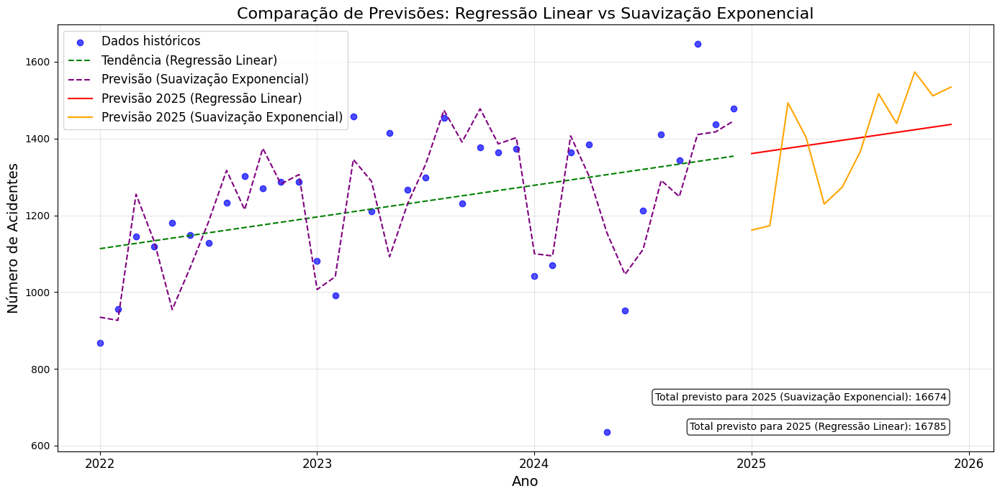

Regressão Linear:
Erro Absoluto Médio (MAE): 133.07
Erro Quadrático Médio (RMSE): 183.47

Suavização Exponencial:
Erro Absoluto Médio (MAE): 93.05
Erro Quadrático Médio (RMSE): 135.03

Coeficientes do modelo (Regressão Linear):
Coeficiente angular: 82.62
Coeficiente linear: -165943.17


In [ ]:
# Regressão Linar vs Suavização Exponencial

# Criar série temporal mensal
def criar_serie_temporal(df):
    df_mensal = df.resample('M', on='data').size().reset_index()
    df_mensal.columns = ['data', 'num_acidentes']
    df_mensal['ano_frac'] = df_mensal['data'].dt.year + (df_mensal['data'].dt.month - 1) / 12
    return df_mensal

# Regressão Linear
def regressao_linear(X, y):
    modelo_lr = LinearRegression()
    modelo_lr.fit(X, y)
    y_pred_lr = modelo_lr.predict(X)
    return modelo_lr, y_pred_lr

# Suavização Exponencial
def modelo_suavizacao_exponencial(y):
    modelo_exp = ExponentialSmoothing(y, trend='add', seasonal='add', seasonal_periods=12)
    resultado_exp = modelo_exp.fit()
    y_pred_exp = resultado_exp.fittedvalues
    return resultado_exp, y_pred_exp

# Avaliar modelos
def avaliar_modelos(y, y_pred_lr, y_pred_exp):
    mae_lr = mean_absolute_error(y, y_pred_lr)
    rmse_lr = np.sqrt(mean_squared_error(y, y_pred_lr))
    mae_exp = mean_absolute_error(y, y_pred_exp)
    rmse_exp = np.sqrt(mean_squared_error(y, y_pred_exp))
    return mae_lr, rmse_lr, mae_exp, rmse_exp

# Plotar resultados
def plotar_resultados(df_mensal, y_pred_lr, y_pred_exp, previsao_2025_lr, previsao_2025_exp, total_2025_lr, total_2025_exp):
    plt.figure(figsize=(14, 7))
    plt.scatter(df_mensal['ano_frac'], df_mensal['num_acidentes'], label='Dados históricos', color='blue', alpha=0.7)
    plt.plot(df_mensal['ano_frac'], y_pred_lr, color='green', linestyle='dashed', label='Tendência (Regressão Linear)')
    plt.plot(df_mensal['ano_frac'], y_pred_exp, color='purple', linestyle='dashed', label='Previsão (Suavização Exponencial)')

    # Plotar previsões para 2025
    anos_2025 = np.arange(2025, 2026, 1/12)
    plt.plot(anos_2025, previsao_2025_lr, color='red', label='Previsão 2025 (Regressão Linear)')
    plt.plot(anos_2025, previsao_2025_exp, color='orange', label='Previsão 2025 (Suavização Exponencial)')
    
    plt.title('Comparação de Previsões: Regressão Linear vs Suavização Exponencial', fontsize=16)
    plt.xlabel('Ano', fontsize=14)
    plt.ylabel('Número de Acidentes', fontsize=14)
    
    # Ajustar o eixo X para mostrar os anos 2022, 2023, 2024 e 2025
    anos_x = np.array([2022, 2023, 2024, 2025, 2026])
    plt.xticks(ticks=anos_x, labels=[str(ano) for ano in anos_x], fontsize=12)
    
    plt.legend(fontsize=12)
    plt.grid(alpha=0.3)
    
    # Anotações no canto inferior direito
    plt.annotate(f"Total previsto para 2025 (Regressão Linear): {int(total_2025_lr)}", 
                 xy=(0.95, 0.05), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                 horizontalalignment='right')
    plt.annotate(f"Total previsto para 2025 (Suavização Exponencial): {int(total_2025_exp)}", 
                 xy=(0.95, 0.12), xycoords='axes fraction', 
                 fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                 horizontalalignment='right')
    
    plt.tight_layout()
    plt.show()

# Carregar e pré-processar dados
df_mensal = criar_serie_temporal(df)

# Definir variáveis para o modelo de Regressão Linear
X = df_mensal[['ano_frac']]
y = df_mensal['num_acidentes']

# Treinar e prever com regressão linear
modelo_lr, y_pred_lr = regressao_linear(X, y)

# Treinar e prever com suavização exponencial
resultado_exp, y_pred_exp = modelo_suavizacao_exponencial(y)

# Criar dados futuros para previsão de janeiro a dezembro de 2025
anos_2025 = np.arange(2025, 2026, 1/12).reshape(-1, 1)
previsao_2025_lr = modelo_lr.predict(anos_2025)
previsao_2025_exp = resultado_exp.forecast(steps=12)

total_2025_lr = previsao_2025_lr.sum()
total_2025_exp = previsao_2025_exp.sum()

# Avaliar modelos
mae_lr, rmse_lr, mae_exp, rmse_exp = avaliar_modelos(y, y_pred_lr, y_pred_exp)

# Plotar resultados
plotar_resultados(df_mensal, y_pred_lr, y_pred_exp, previsao_2025_lr, previsao_2025_exp, total_2025_lr, total_2025_exp)

# Exibir métricas e coeficientes
print("Regressão Linear:")
print(f"Erro Absoluto Médio (MAE): {mae_lr:.2f}")
print(f"Erro Quadrático Médio (RMSE): {rmse_lr:.2f}")
print("\nSuavização Exponencial:")
print(f"Erro Absoluto Médio (MAE): {mae_exp:.2f}")
print(f"Erro Quadrático Médio (RMSE): {rmse_exp:.2f}")
print("\nCoeficientes do modelo (Regressão Linear):")
print(f"Coeficiente angular: {modelo_lr.coef_[0]:.2f}")
print(f"Coeficiente linear: {modelo_lr.intercept_:.2f}")


In [7]:
# Importar as Bibliotecas

import pandas as pd
import numpy as np
from prophet import Prophet
import plotly.graph_objects as go
from dash import Dash, dcc, html, Input, Output

# Carregar e pré-processar os dados
df = pd.read_csv(r'C:\Users\renan\OneDrive\Documentos\Arquivos_CSV\cat_acidentes.csv', sep=';', header=0)

df['data'] = pd.to_datetime(df['data'], errors='coerce')
df['ano'] = df['data'].dt.year

df = df[~df['ano'].isin([2202, 2026, 2027, 2025, 2020, 2021])]
df = df[df['data'].dt.year < 2025]


# Função para criar série temporal mensal
def criar_serie_temporal(df):
    df_mensal = df.resample('M', on='data').size().reset_index()
    df_mensal.columns = ['data', 'num_acidentes']
    return df_mensal

# Função para treinar e prever com Prophet
def modelo_prophet(df_mensal):
    df_prophet = df_mensal.rename(columns={'data': 'ds', 'num_acidentes': 'y'})
    
    modelo = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
    modelo.fit(df_prophet)
    
    futuro = modelo.make_future_dataframe(periods=12, freq='M')
    previsao = modelo.predict(futuro)
    
    return modelo, previsao

# Função para avaliar modelos
def avaliar_modelos(y, y_pred):
    mae = mean_absolute_error(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    return mae, rmse


# Criar série temporal mensal
df_mensal = criar_serie_temporal(df)

# Treinar e prever com Prophet
modelo, previsao = modelo_prophet(df_mensal)

# Avaliar o modelo
y_true = df_mensal['num_acidentes']
y_pred = previsao.loc[:len(y_true) - 1, 'yhat']
mae, rmse = avaliar_modelos(y_true, y_pred)

# Total previsto para 2025
total_2025 = previsao.loc[previsao['ds'].dt.year == 2025, 'yhat'].sum()

# Criar o dashboard com Dash
app = Dash(__name__)

# Layout do dashboard
app.layout = html.Div([
    html.H1("Dashboard de Previsão de Acidentes", style={'textAlign': 'center'}),

    # Gráfico de Previsões
    dcc.Graph(id='grafico-previsoes'),

    # Métricas de Avaliação e Total Previsto para 2025
    html.Div([
        html.H3("Métricas de Avaliação:"),
        html.P(f"Erro Absoluto Médio (MAE): {mae:.2f}"),
        html.P(f"Erro Quadrático Médio (RMSE): {rmse:.2f}"),
        
        # Indicador do Total Previsto para 2025
        dcc.Graph(
            id='indicador-total-2025',
            figure=go.Figure(go.Indicator(
                mode="number",
                value=int(total_2025),
                title={"text": "Total Previsto para 2025"},
                number={'valueformat': '0,.0f'}  # Exibir com ponto como separador
            )),
            style={'width': '30%', 'display': 'inline-block'}
        ),
    ], style={'margin': '20px'}),

    # Componentes do Modelo (Tendência e Sazonalidade)
    dcc.Graph(id='componentes-modelo'),
])

# Callback para atualizar o gráfico de previsões
@app.callback(
    Output('grafico-previsoes', 'figure'),
    Input('grafico-previsoes', 'relayoutData')
)
def atualizar_grafico_previsoes(relayoutData):
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=df_mensal['data'], y=df_mensal['num_acidentes'],
        mode='markers', name='Dados Históricos',
        marker=dict(color='blue', size=8, opacity=0.7)
    ))
    
    fig.add_trace(go.Scatter(
        x=previsao['ds'], y=previsao['yhat'],
        mode='lines', name='Previsão (Prophet)',
        line=dict(color='green', dash='dash')
    ))
    
    fig.add_trace(go.Scatter(
        x=previsao['ds'], y=previsao['yhat_upper'],
        mode='lines', line=dict(width=0),
        showlegend=False
    ))
    fig.add_trace(go.Scatter(
        x=previsao['ds'], y=previsao['yhat_lower'],
        mode='lines', line=dict(width=0),
        fillcolor='rgba(0, 100, 0, 0.2)',
        fill='tonexty', showlegend=False
    ))
    
    fig.update_layout(
        title='Previsão de Acidentes para 2025 (Prophet)',
        xaxis_title='Ano',
        yaxis_title='Número de Acidentes',
        legend=dict(x=0.02, y=0.98),
        margin=dict(l=40, r=40, t=40, b=40),
        template='plotly_white'
    )
    
    return fig

# Callback para exibir os componentes do modelo Prophet no formato Plotly
@app.callback(
    Output('componentes-modelo', 'figure'),
    Input('componentes-modelo', 'relayoutData')
)
def atualizar_componentes_modelo(relayoutData):
    # Extraindo os componentes do modelo Prophet
    previsao_componentes = modelo.predict(previsao)
    
    fig = go.Figure()

    # Tendência
    fig.add_trace(go.Scatter(
        x=previsao_componentes['ds'],
        y=previsao_componentes['trend'],
        mode='lines',
        name='Tendência',
        line=dict(color='blue')
    ))

    # Sazonalidade anual
    if 'yearly' in previsao_componentes.columns:
        fig.add_trace(go.Scatter(
            x=previsao_componentes['ds'],
            y=previsao_componentes['yearly'],
            mode='lines',
            name='Sazonalidade Anual',
            line=dict(color='green', dash='dot')
        ))

    # Configuração do layout
    fig.update_layout(
        title="Componentes do Modelo Prophet",
        xaxis_title="Data",
        yaxis_title="Impacto",
        template="plotly_white"
    )

    return fig


# Executar o dashboard
if __name__ == '__main__':
    print("Acesse o dashboard em: http://127.0.0.1:8050/")
    app.run_server(debug=True)


19:01:46 - cmdstanpy - INFO - Chain [1] start processing
19:01:50 - cmdstanpy - INFO - Chain [1] done processing


Acesse o dashboard em: http://127.0.0.1:8050/
